In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df_unmod = pd.read_csv("resources/PreparingDatasets/Diabetes.csv")
df_unmod.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [3]:
cols = [c for c in df_unmod.columns if c not in ["Pregnancies", "Outcome"]]
df = df_unmod.copy()
df[cols] = df[cols].replace({0:np.NaN})
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.0,NaN,33.6,0.627,50.0,1
1,1,85.0,66.0,29.0,NaN,26.6,0.351,31.0,0
2,8,183.0,64.0,NaN,NaN,23.3,0.672,32.0,1
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21.0,0
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33.0,1


In [4]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,763.000000,733.000000,541.000000,394.000000,757.000000,768.000000,768.000000,768.000000
mean,3.845052,121.686763,72.405184,29.153420,155.548223,32.457464,0.471876,33.240885,0.348958
std,3.369578,30.535641,12.382158,10.476982,118.775855,6.924988,0.331329,11.760232,0.476951
min,0.000000,44.000000,24.000000,7.000000,14.000000,18.200000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,64.000000,22.000000,76.250000,27.500000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,29.000000,125.000000,32.300000,0.372500,29.000000,0.000000
75%,6.000000,141.000000,80.000000,36.000000,190.000000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   763 non-null    float64
 2   BloodPressure             733 non-null    float64
 3   SkinThickness             541 non-null    float64
 4   Insulin                   394 non-null    float64
 5   BMI                       757 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    float64
 8   Outcome                   768 non-null    int64  
dtypes: float64(7), int64(2)
memory usage: 54.1 KB


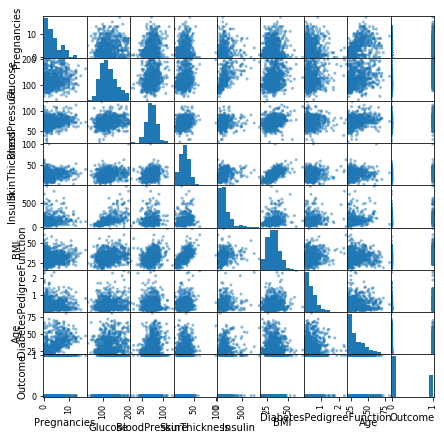

In [6]:
# Scatter Matrix
pd.plotting.scatter_matrix(df,figsize=(7,7));

In [7]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.0,NaN,33.6,0.627,50.0,1
1,1,85.0,66.0,29.0,NaN,26.6,0.351,31.0,0
2,8,183.0,64.0,NaN,NaN,23.3,0.672,32.0,1
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21.0,0
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33.0,1


In [8]:
df2 = df.dropna() # this drops the entire row containing a NaN. Prob in the real world this could skew your statistics in a weird wway so be currrful
df2.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21.0,0
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33.0,1
6,3,78.0,50.0,32.0,88.0,31.0,0.248,26.0,1
8,2,197.0,70.0,45.0,543.0,30.5,0.158,53.0,1
13,1,189.0,60.0,23.0,846.0,30.1,0.398,59.0,1


In [9]:
colors = df2["Outcome"].map(lambda x:"blue" if x else "red")
df2.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21.0,0
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33.0,1
6,3,78.0,50.0,32.0,88.0,31.0,0.248,26.0,1
8,2,197.0,70.0,45.0,543.0,30.5,0.158,53.0,1
13,1,189.0,60.0,23.0,846.0,30.1,0.398,59.0,1


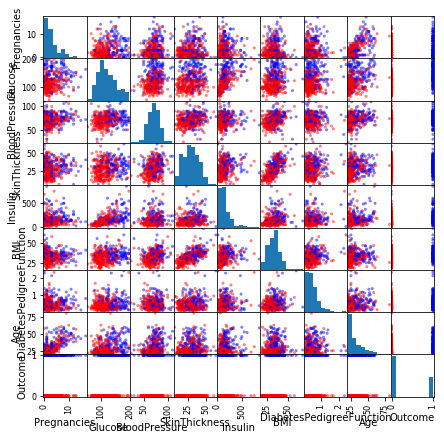

In [11]:
pd.plotting.scatter_matrix(df2,figsize=(7,7), color=colors);

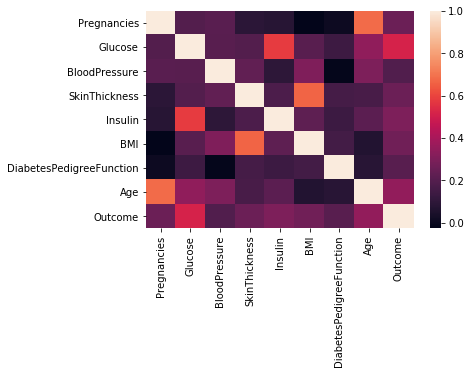

In [10]:
# correlation plots
df2.corr() # this shows the correlation between each variable
sns.heatmap(df2.corr()); # color coded

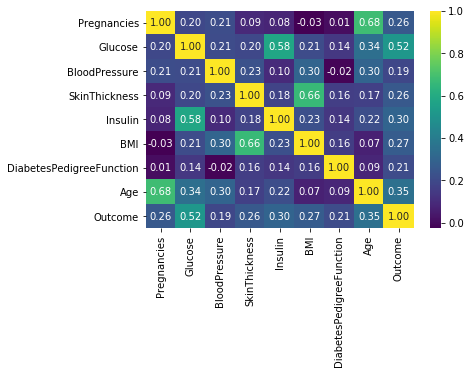

In [12]:
sns.heatmap(df2.corr(), annot=True, cmap="viridis", fmt="0.2f"); # annotated a lot better

In [13]:
# 2d histograms
df3 = pd.read_csv("resources/ND/height_weight.csv")

In [14]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4231 entries, 0 to 4230
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   sex     4231 non-null   int64  
 1   height  4231 non-null   float64
 2   weight  4231 non-null   float64
dtypes: float64(2), int64(1)
memory usage: 99.3 KB


In [15]:
df3.describe()

,sex,height,weight
count,4231.000000,4231.000000,4231.000000
mean,1.540061,66.903607,174.095122
std,0.498451,4.313004,38.896171
min,1.000000,55.400000,96.590000
25%,1.000000,63.730000,144.315000
50%,2.000000,66.630000,170.100000
75%,2.000000,69.970000,198.660000
max,2.000000,79.610000,298.440000


Text(0, 0.5, 'Weight')

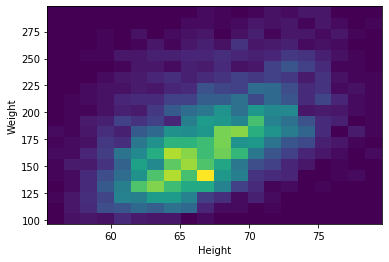

In [16]:
plt.hist2d(df3["height"],df3["weight"],bins=20)
plt.xlabel("Height")
plt.ylabel("Weight")

In [17]:
# Contour plots

In [18]:
hist, x_edge, y_edge = np.histogram2d(df3["height"],df3["weight"],bins=20)

In [20]:
x_edge # this is the units on the x-axis

array([55.4   , 56.6105, 57.821 , 59.0315, 60.242 , 61.4525, 62.663 ,
       63.8735, 65.084 , 66.2945, 67.505 , 68.7155, 69.926 , 71.1365,
       72.347 , 73.5575, 74.768 , 75.9785, 77.189 , 78.3995, 79.61  ])

In [19]:
x_center = 0.5 * (x_edge[1:] + x_edge[:-1])
y_center = 0.5 * (y_edge[1:] + y_edge[:-1])

In [21]:
len(x_center[:-1])

19

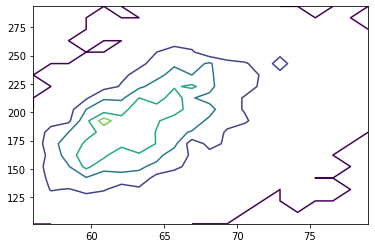

In [22]:
plt.contour(x_center,y_center, hist, levels=5) # kind of rough since not enough points

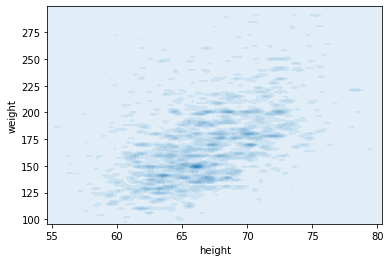

In [23]:
sns.kdeplot(df3["height"],df3["weight"], bw=0.25, shade=True) # smooths it out since each point is summed as a normal dist. I sorta think this is effectively a gaussian blur though.
# bw controls the size of the gaussian. you can also specify in actual numbers as an [x,y] array
# plt.hist2d(df3["height"],df3["weight"],bins=20, alpha=0.3); # you can also plot more stuff on top of it

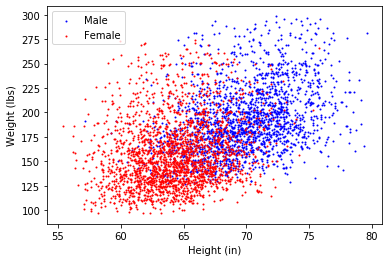

In [24]:
mask = df3["sex"] == 1
plt.scatter(df3.loc[mask,"height"], df3.loc[mask,"weight"], c="blue", s=1, label="Male")
plt.scatter(df3.loc[~mask,"height"], df3.loc[~mask,"weight"], c="red", s=1, label="Female")
plt.xlabel("Height (in)")
plt.ylabel("Weight (lbs)")
plt.legend(loc=2)

In [32]:
from chainconsumer import ChainConsumer

In [31]:
params = ["height", "weight"]
male = df3.loc[mask,params].values
female = df3.loc[~mask,params].values

(1946, 2)

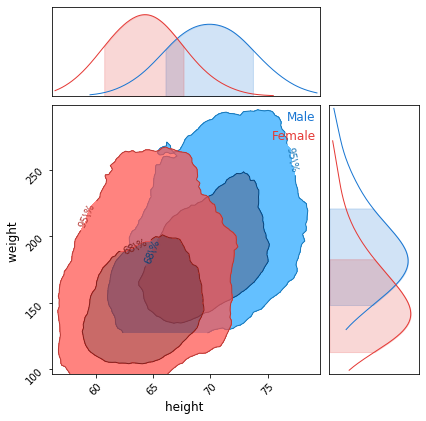

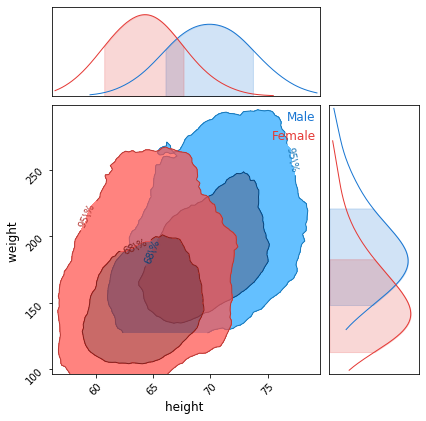

In [39]:
c = ChainConsumer()
c.add_chain(male, parameters=params, name="Male", kde=1.0, color="b")
c.add_chain(female, parameters=params, name="Female", kde=1.0, color="r")
c.configure(usetex=False, serif=False, contour_labels="Confidence")
# c.configure(contour_labels="Confidence")
c.plotter.plot(figsize=2.0)

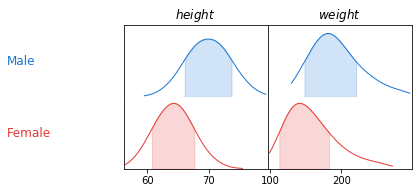

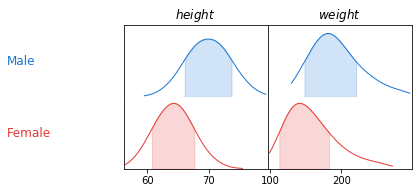

In [40]:
c.plotter.plot_summary(figsize=2.0)